# Quantum Annealing Lab Mini-Project: Binary Phase Optical Phased Arrays (OPA)

This mini-project tutorial explores the application of Quantum Annealing to a real-world optimization problem in **Silicon Photonics**: designing the phase profile for a 1D Binary Optical Phased Array (OPA) to maximize beam intensity in a specific target direction.

Schematics by AIs:
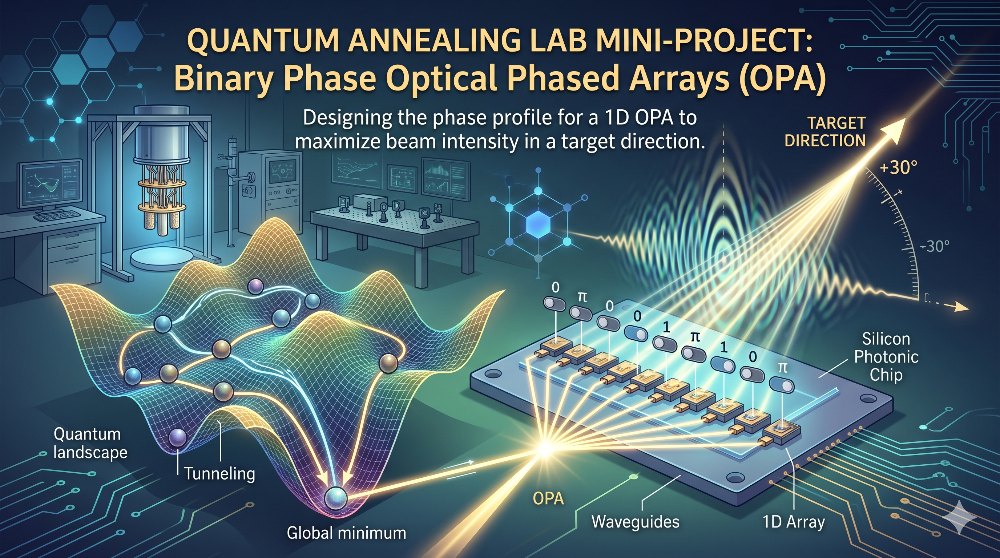
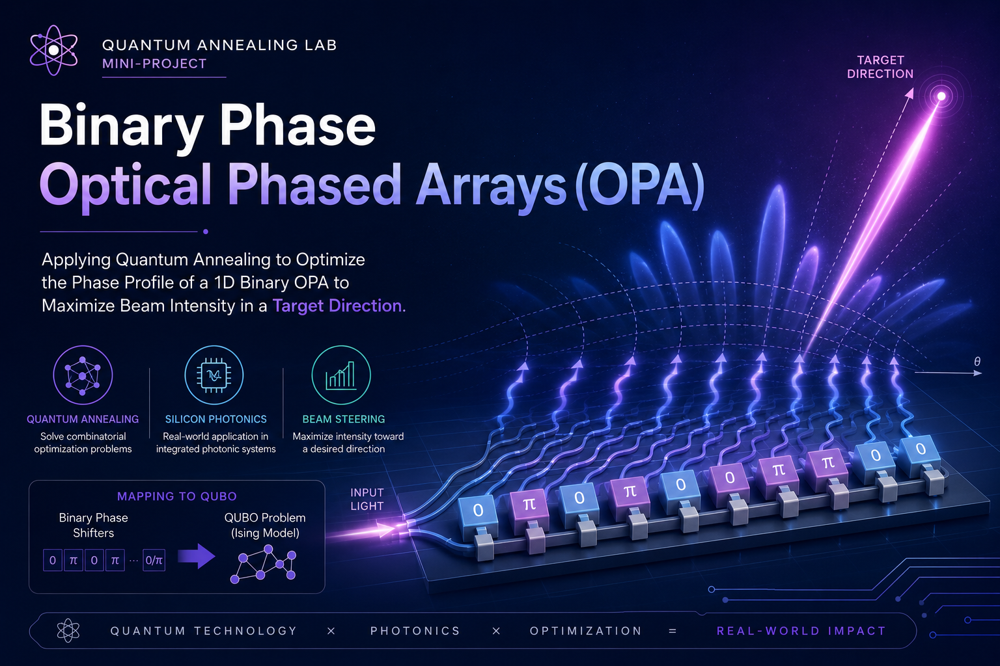

---

## 1. Background & Motivation

**Optical Phased Arrays (OPAs)** are the photonic analog of radio-frequency phased arrays. By controlling the relative phase of light emitted from an array of closely spaced emitters, we can steer an optical beam to arbitrary angles without any mechanical moving parts.

A **binary-phase OPA** restricts each phase to only two states: $\varphi_n \in \{0, \pi\}$. 
This dramatically simplifies the control electronics — each element needs only a single-bit digital driver. The trade-off is reduced beam quality and optimization complexity, which makes it a perfect candidate for combinatorial optimization algorithms like Quantum Annealing.

## 2. Formulation of $I(\theta)$ and Conversion to QUBO/Ising

Consider a 1D linear array of identical emitters with uniform spacing $d$. The wavelength is $\lambda$, and the free-space wavenumber is $k = 2\pi/\lambda$.
The far-field **intensity pattern** $I(\theta)$ is given by:

$$I(\theta) = \left| \sum_{n=-(N/2)}^{N/2} e^{\,j(n k d \sin\theta + \varphi_n)} \right|^2$$

For a binary OPA, $\varphi_n \in \{0, \pi\}$. We can define a spin variable $x_n = e^{j\varphi_n} \in \{+1, -1\}$. Expanding the magnitude squared gives:

$$I(\theta) = \sum_{n=-(N/2)}^{N/2} \sum_{m=-(N/2)}^{N/2} x_n x_m \cos((n-m) k d \sin\theta)$$

### The Objective Function
We want to **maximize** the total energy directed into a target angular region, from $\theta_1$ to $\theta_2$. 
The objective function is the integral of $I(\theta)$ over this range:

$$\text{Maximize } E = \int_{\theta_1}^{\theta_2} I(\theta) d\theta = \sum_{n=-(N/2)}^{N/2} \sum_{m=-(N/2)}^{N/2} x_n x_m \int_{\theta_1}^{\theta_2} \cos((n-m) k d \sin\theta) d\theta$$

Let the integral term be $J_{nm}$:
$$J_{nm} = \int_{\theta_1}^{\theta_2} \cos((n-m) k d \sin\theta) d\theta$$

Then our objective is to maximize $\sum_{n,m} J_{nm} x_n x_m$. Since quantum annealers **minimize** energy, we can define our Ising Hamiltonian as:

$$H = \sum_{n,m} (-J_{nm}) x_n x_m$$

This is exactly an **Ising Model** with spin variables $x_n \in \{-1, +1\}$!

## 3. Simulated Annealing (SA) Optimization

First, we will set up the physical parameters, compute the $J_{nm}$ coupling matrix using numerical integration, and solve it using Simulated Annealing.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as integrate
import dimod
from dwave.samplers import SimulatedAnnealingSampler

# Physical Parameters
N = 64                        # Parameter N (Note: array will go from -N/2 to N/2, total 65 elements)
lam = 1.55e-6                 # Wavelength [m]
k = 2 * np.pi / lam           # Wavenumber
d = lam / 2                   # Element spacing (ideal: lambda/2)

# Target steering angle range [theta1, theta2] (in radians)
# Let's steer the beam between theta1 and theta2 degrees
theta1 = np.deg2rad(55)
theta2 = np.deg2rad(60)

print(f"Optimizing Binary OPA to steer beam into [{np.rad2deg(theta1):.1f}°, {np.rad2deg(theta2):.1f}°]")

Optimizing Binary OPA to steer beam into [45.0°, 60.0°]


### Compute the Coupling Matrix $J_{nm}$

In [7]:
# Array of physical indices from -N/2 to N/2
n_arr = np.arange(-N//2, N//2 + 1)
N_actual = len(n_arr)  # Total number of elements (65 for N=64)

# Initialize J matrix
J = np.zeros((N_actual, N_actual))

# Function to compute the integral for a given (n, m)
def integrand(theta, n, m):
    return np.cos((n - m) * k * d * np.sin(theta))

# Compute elements
for i in range(N_actual):
    for j in range(N_actual):
        if i != j:
            n = n_arr[i]
            m = n_arr[j]
            # Numerical integration using scipy.integrate.quad
            val, _ = integrate.quad(integrand, theta1, theta2, args=(n, m))
            J[i, j] = val

# We negate J because the annealer minimizes, but we want to maximize the integral
h = {i: 0.0 for i in range(N_actual)}  # No linear biases
# dimod expects J as a dictionary of upper triangular pairs
J_dict = {(i, j): -J[i, j] for i in range(N_actual) for j in range(i+1, N_actual)}

# Create Binary Quadratic Model (BQM)
bqm = dimod.BinaryQuadraticModel(h, J_dict, 0.0, dimod.SPIN)
print(f"BQM created successfully with {N_actual} variables.")

BQM created successfully with 65 variables.


### Run Simulated Annealing

In [8]:
# Use the D-Wave Simulated Annealing sampler
sa_sampler = SimulatedAnnealingSampler()

print("Running Simulated Annealing...")
# We run 1000 sweeps to find a good solution
sa_response = sa_sampler.sample(bqm, num_reads=1000)

# Get the best sample
best_sample = sa_response.first.sample
best_energy = sa_response.first.energy

print(f"Best Energy found by SA: {best_energy}")

# Convert spin states {-1, 1} to phases {pi, 0} for plotting
# If x_n = 1, phase = 0. If x_n = -1, phase = pi.
best_phases = np.array([0 if best_sample[i] == 1 else np.pi for i in range(N_actual)])
phase_binary = (best_phases / np.pi).astype(int)

print(f"\nOptimized Phases (in multiples of pi):\n{phase_binary}")

Running Simulated Annealing...
Best Energy found by SA: -39.279971048612715

Optimized Phases (in multiples of pi):
[0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 1 0 0
 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 0]


### Plot the Optimized Beam Pattern
Let's calculate $I(\theta)$ across the full $-90^{\circ}$ to $90^{\circ}$ range and plot it to verify if the energy is indeed focused in our target region.
We will also compute the **Steering Efficiency ($r$)**, which is the ratio of the energy in the target region to the total radiated energy:
$$r = \frac{\int_{\theta_1}^{\theta_2} I(\theta)d\theta}{\int_{-\pi/2}^{\pi/2} I(\theta)d\theta}$$

Steering Efficiency (r): 42.31% (0.4231)


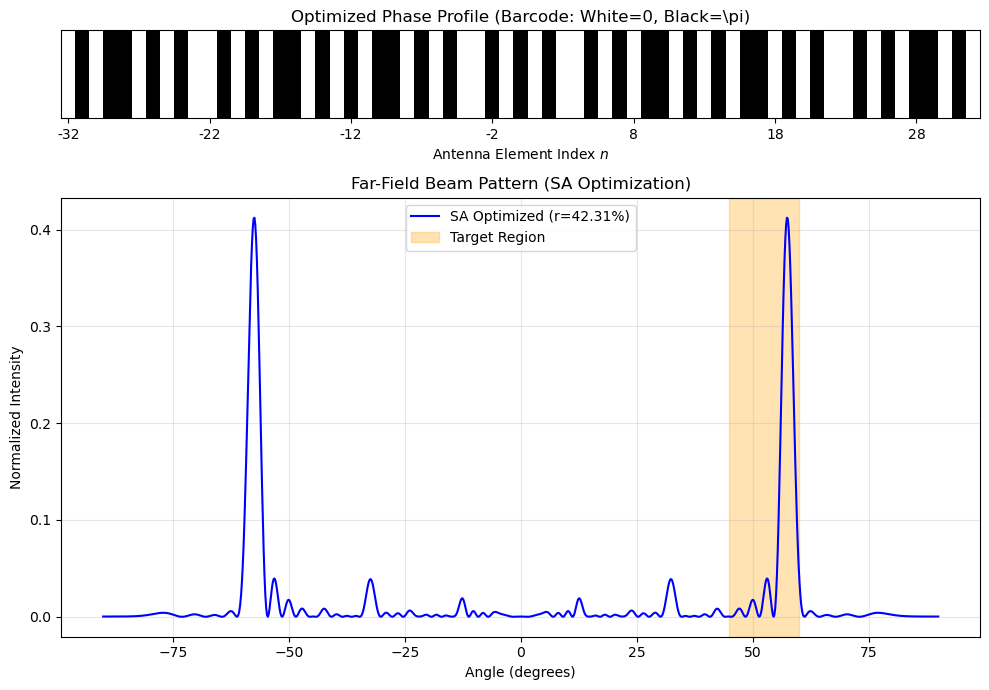

In [9]:
# Observation angles
N_theta = 1000
theta_deg = np.linspace(-90, 90, N_theta)
theta_rad = np.deg2rad(theta_deg)

# Function to compute normalized Array Factor (Intensity)
def compute_array_factor(phases, n_arr, k, d, theta_rad):
    psi = k * d * np.outer(n_arr, np.sin(theta_rad))
    total_phase = psi + phases[:, np.newaxis]
    AF = np.sum(np.exp(1j * total_phase), axis=0) / len(n_arr)
    return np.abs(AF)**2

intensity = compute_array_factor(best_phases, n_arr, k, d, theta_rad)

# Compute Steering Efficiency (r) using discrete sum approximation
# Since our angular grid is uniform, the ratio of sums is equivalent to the ratio of integrals.
total_power = np.sum(intensity)
target_mask = (theta_rad >= theta1) & (theta_rad <= theta2)
target_power = np.sum(intensity[target_mask])
r = target_power / total_power
print(f"Steering Efficiency (r): {r:.2%} ({r:.4f})")

# Plotting (Barcode + Beam Pattern)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), gridspec_kw={'height_ratios': [1, 5]})

# 1. Barcode plot for the phase profile
ax1.imshow(phase_binary.reshape(1, -1), cmap='binary', aspect='auto')
ax1.set_title(r'Optimized Phase Profile (Barcode: White=0, Black=\pi)')
ax1.set_yticks([])
ax1.set_xticks(range(0, N_actual, 10))
ax1.set_xticklabels(n_arr[::10])
ax1.set_xlabel('Antenna Element Index $n$')

# 2. Far-field Beam Pattern
ax2.plot(theta_deg, intensity, label=f'SA Optimized (r={r:.2%})', color='blue')
ax2.axvspan(np.rad2deg(theta1), np.rad2deg(theta2), color='orange', alpha=0.3, label='Target Region')

ax2.set_title('Far-Field Beam Pattern (SA Optimization)')
ax2.set_xlabel('Angle (degrees)')
ax2.set_ylabel('Normalized Intensity')
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.show()

## 4. Student Task: Quantum Annealing (QA)

Now it's your turn! The matrix $J_{nm}$ is already computed and stored in the `bqm` variable. 
Your task is to run this same problem on a real D-Wave Quantum Processing Unit (QPU).

### Instructions:
1. Initialize the `DWaveSampler` and `EmbeddingComposite`.
2. Sample the `bqm` using the QPU (try `num_reads=1000`).
3. Extract the best sample, convert the spins to phases, and plot the intensity pattern.
4. Compare the QPU energy and beam pattern with the SA results. Compute the steering efficiency $r$ for the QPU solution. Is the QPU able to find a comparable or better solution?

### Hints & Possible Approaches:

1. **Sampler Initialization**: Ensure you pass the `DWaveSampler()` into the `EmbeddingComposite()` to automatically handle the minor-embedding of our fully connected $65 \times 65$ BQM onto the QPU's topology (e.g., Pegasus or Zephyr graph).
2. **Parameter Tuning**: If the QPU results are sub-optimal compared to SA, consider increasing `num_reads` or adjusting the `annealing_time` (e.g., `annealing_time=50` or `100` $\mu$s). 
3. **Chain Strength**: Since our graph is fully connected (a clique), the embedding will require many physical qubits to represent one logical variable (a chain). If the chains break, the results will be poor. You might need to manually set the `chain_strength` parameter in `.sample()` (try a value comparable to the maximum absolute value in your $J$ matrix).

### Useful References:**
- [D-Wave Ocean SDK Documentation](https://docs.ocean.dwavesys.com/en/stable/)
- [EmbeddingComposite API](https://docs.ocean.dwavesys.com/projects/system/en/stable/reference/composites/embedding.html)
- [DWaveSampler API](https://docs.ocean.dwavesys.com/projects/system/en/stable/reference/samplers.html#dwavesampler)
- [Tuning Chain Strength](https://docs.ocean.dwavesys.com/en/stable/concepts/embedding.html#chain-strength)


In [10]:
# ----------------------------------------------------
# STUDENT TASK: Quantum Annealing Implementation
# ----------------------------------------------------
from dwave.system import DWaveSampler, EmbeddingComposite

# 1. Initialize Sampler
# qa_sampler = ...

# 2. Sample the BQM
# print("Running on D-Wave QPU...")
# qa_response = ...

# 3. Extract best sample and calculate phases
# best_qa_sample = ...
# print(f"Best Energy found by QA: ...")
# best_qa_phases = ...
# print(f"\nOptimized Phases (in multiples of pi):\n{(best_qa_phases / np.pi).astype(int)}")

# 4. Plot the Intensity, Phase Barcode, and compute the Efficiency ratio (r)
# intensity_qa = ...
# total_power_qa = ...
# target_power_qa = ...
# r_qa = ...
# print(f"QPU Steering Efficiency (r): {r_qa:.2%}")
# 
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), gridspec_kw={'height_ratios': [1, 5]})
# ax1.imshow(...)  # Barcode plot
# ax2.plot(...)    # Beam pattern plot
# plt.show()
